In [ ]:
from __future__ import print_function

In [ ]:
import librosa
import librosa.display
import IPython.display
import numpy as np
import math
from numpy import fft as fft

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.style as ms
ms.use('seaborn-muted')
%matplotlib inline

In [ ]:
data_folder = "data/audio/other/"
filename = "morricone_30s.mp3"

audio_path = data_folder+filename

In [ ]:
# Load the track in mono
y, sr = librosa.load(audio_path, mono=True, sr=44100)

In [ ]:
# Load the track in stereo
y_stereo, sr = librosa.load(audio_path, mono=False, sr=44100)

#### Play it back in mono!

In [8]:
# Play it back in mono!
IPython.display.Audio(data=y, rate=sr)

#### Play it back in stereo!

In [9]:
# Play it back in stereo!
IPython.display.Audio(data=y_stereo, rate=sr)

In [10]:
#grab both channels
channel1 = y_stereo[0] #left 
channel2 = y_stereo[1] #right

### Visual exploration

#### Amplitude (or loudness) over time

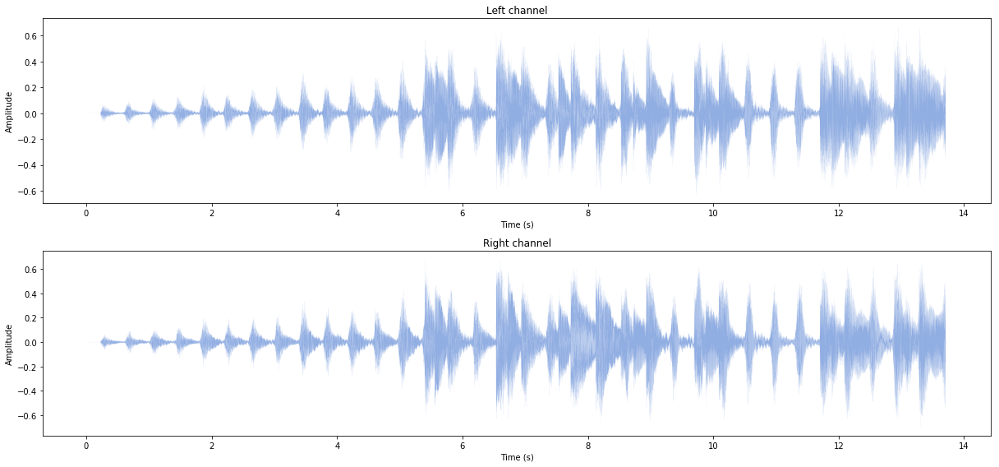

In [53]:
time = np.arange(0, float(channel1.shape[0]), 1) / sr 

#plot amplitude (or loudness) over time
plt.figure(figsize=(17,8))

plt.figure(1)
plt.subplot(211)
plt.title('Left channel')
plt.plot(time, channel1, linewidth=0.06, alpha=0.6)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

plt.subplot(212)
plt.title('Right channel')
plt.plot(time, channel2, linewidth=0.06, alpha=0.6)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.tight_layout()
# plt.savefig(temp_folder+'ampiltude.png', bbox_inches='tight')

#### Frequency (pitch) over time

/Users/akurochkin/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:492: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


Text(0,0.5,'Amplitude')

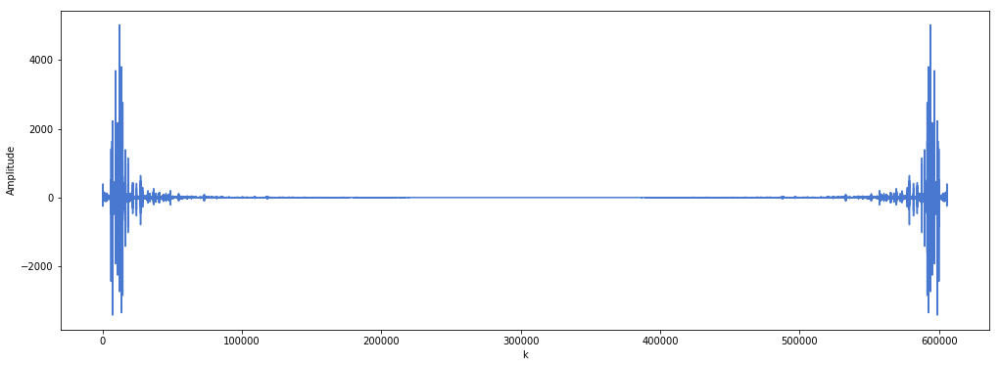

In [54]:
#Frequency (pitch) over time

#a fourier transform breaks the sound wave into series of waves that make up the main sound wave
#each of these waves will have its own amplitude (volume) and frequency. The frequency is the length over which the wave repeats itself. this is known as the pitch of the sound
fourier=fft.fft(y)

plt.figure(figsize=(17,6))
plt.plot(fourier)
plt.xlabel('k')
plt.ylabel('Amplitude')
# plt.savefig(temp_folder+'fft.png', bbox_inches='tight')

In [56]:
#the fourier is symetrical due to the real and imaginary soultion. only interested in first real solution
n = len(y) 
fourier = fourier[0:(math.ceil(n/2))]

# scale by the number of points so that the magnitude does not depend on the length 
fourier = fourier / float(n) 
                 
#calculate the frequency at each point in Hz
freqArray = np.arange(0, (n/2), 1.0) * (sr*1.0/n);

/Users/akurochkin/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:492: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


Text(0,0.5,'Power (dB)')

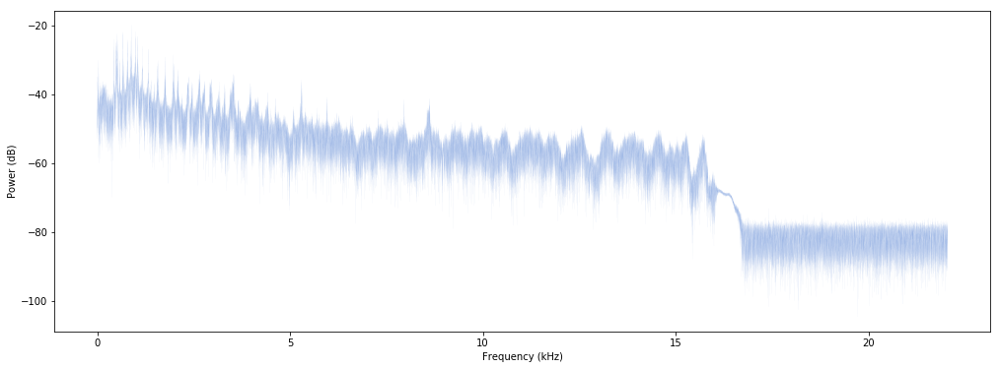

In [57]:
plt.figure(figsize=(17,6))
plt.plot(freqArray/1000, 10*np.log10(fourier), linewidth=0.02)
plt.xlabel('Frequency (kHz)')
plt.ylabel('Power (dB)')
# plt.savefig(temp_folder+'frequencies.png', bbox_inches='tight')

#### Spectogram

/Users/akurochkin/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:7221: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


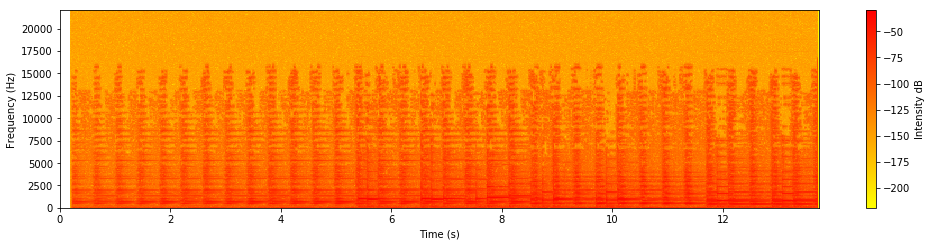

In [19]:
#plot spectogram
#the function calculates many fft's over NFFT sized blocks of data
#increasing NFFT gives you a more detail across the spectrum range but decreases the samples per second
#the sampling rate used determines the frequency range seen always 0 to rate/2

plt.figure(2, figsize=(17,8))
plt.subplot(211)
Pxx, freqs, bins, im = plt.specgram(y, Fs=sr, NFFT=1024, cmap=plt.get_cmap('autumn_r'))
cbar=plt.colorbar(im)
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
cbar.set_label('Intensity dB')

#### Mel-scaled power (energy-squared) spectrogram

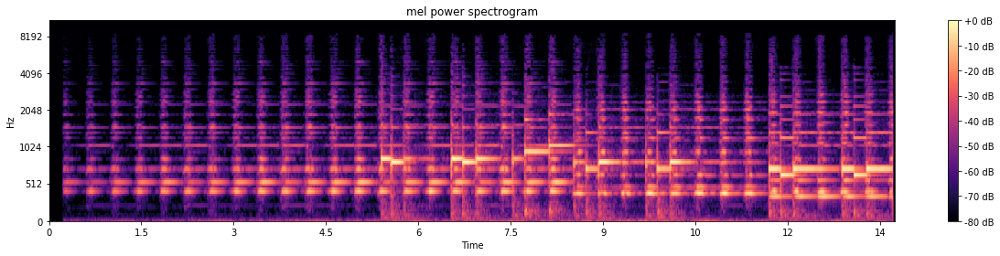

In [29]:
# Let's make and display a mel-scaled power (energy-squared) spectrogram
S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.max)

# Make a new figure
plt.figure(figsize=(17,4))

# Display the spectrogram on a mel scale
# sample rate and hop length parameters are used to render the time axis
librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')

# Put a descriptive title on the plot
plt.title('mel power spectrogram')

# draw a color bar
plt.colorbar(format='%+02.0f dB')

# Make the figure layout compact
plt.tight_layout()

### Harmonic-percussive source separation

In [30]:
# separating harmonic and percussive components?
y_harmonic, y_percussive = librosa.effects.hpss(y)

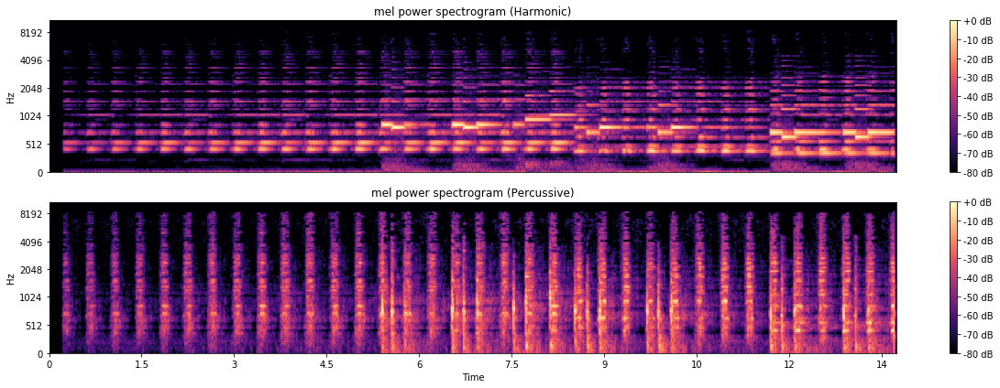

In [31]:
# What do the spectrograms look like?
# Let's make and display a mel-scaled power (energy-squared) spectrogram
S_harmonic   = librosa.feature.melspectrogram(y_harmonic, sr=sr)
S_percussive = librosa.feature.melspectrogram(y_percussive, sr=sr)

# Convert to log scale (dB). We'll use the peak power as reference.
log_Sh = librosa.power_to_db(S_harmonic, ref=np.max)
log_Sp = librosa.power_to_db(S_percussive, ref=np.max)

# Make a new figure
plt.figure(figsize=(17,6))

plt.subplot(2,1,1)
# Display the spectrogram on a mel scale
librosa.display.specshow(log_Sh, sr=sr, y_axis='mel')

# Put a descriptive title on the plot
plt.title('mel power spectrogram (Harmonic)')

# draw a color bar
plt.colorbar(format='%+02.0f dB')

plt.subplot(2,1,2)
librosa.display.specshow(log_Sp, sr=sr, x_axis='time', y_axis='mel')

# Put a descriptive title on the plot
plt.title('mel power spectrogram (Percussive)')

# draw a color bar
plt.colorbar(format='%+02.0f dB')

# Make the figure layout compact
plt.tight_layout()

#### Play the harmonic component

In [26]:
# Play the harmonic component
IPython.display.Audio(data=y_harmonic, rate=sr)

#### Play the percussive component

In [27]:
# Play the percussive component
IPython.display.Audio(data=y_percussive, rate=sr)

### Decomposition

In [80]:
# Let's decompose a spectrogram with NMF, and then resynthesize an individual component
D = librosa.stft(y)

# Separate the magnitude and phase
S, phase = librosa.magphase(D)

# Decompose by nmf
components, activations = librosa.decompose.decompose(S, n_components=8, sort=True)

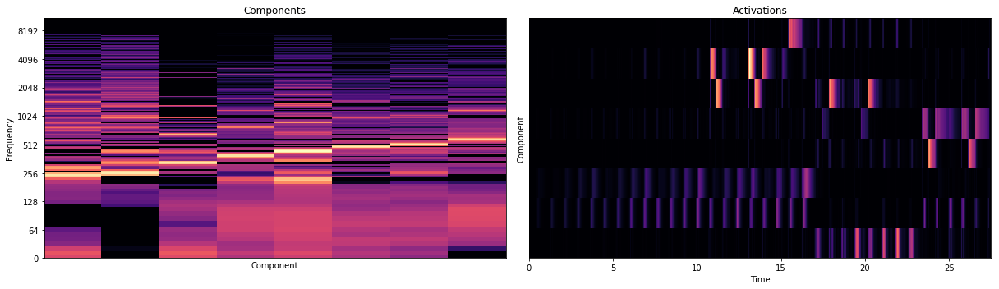

In [81]:
# Visualize the components and activations

plt.figure(figsize=(17,5))

plt.subplot(1,2,1)
librosa.display.specshow(librosa.amplitude_to_db(np.abs(components), ref=np.max), y_axis='log')
plt.xlabel('Component')
plt.ylabel('Frequency')
plt.title('Components')

plt.subplot(1,2,2)
librosa.display.specshow(activations, x_axis='time')
plt.xlabel('Time')
plt.ylabel('Component')
plt.title('Activations')

plt.tight_layout()

In [82]:
print(components.shape, activations.shape)

(1025, 8) (8, 1184)


In [83]:
# Play back the reconstruction
# Reconstruct a spectrogram by the outer product of component k and its activation
D_k = components.dot(activations)

# invert the stft after putting the phase back in
y_k = librosa.istft(D_k * phase)

In [84]:
# And playback
print('Full reconstruction')

IPython.display.Audio(data=y_k, rate=sr)

Full reconstruction


In [88]:
y_result = []

for i in range(0,components.shape[1]):
    # Reconstruct a spectrogram by the outer product of component k and its activation
    D_k = np.multiply.outer(components[:, i], activations[i])

    # invert the stft after putting the phase back in
    y_k = librosa.istft(D_k * phase)
    
    y_result.append(y_k)

In [90]:
y_result

[array([ 0.000000e+00,  0.000000e+00,  0.000000e+00, ..., -8.678834e-05,
        -9.320854e-05, -9.912718e-05], dtype=float32),
 array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 1.6378524e-05,
        1.7275981e-05, 1.8697299e-05], dtype=float32),
 array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
        -4.3020837e-06, -1.6045784e-05, -2.6831080e-05], dtype=float32),
 array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 2.9514915e-05,
        1.6941976e-05, 2.7060105e-06], dtype=float32),
 array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
        -2.0231271e-05, -1.2504857e-05, -5.6769791e-06], dtype=float32),
 array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 1.8488405e-05,
        2.3752264e-05, 2.8867607e-05], dtype=float32),
 array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 2.1818360e-05,
        3.1763906e-05, 4.1157917e-05], dtype=float32),
 array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
        -5.1527746e-05, -3.6599

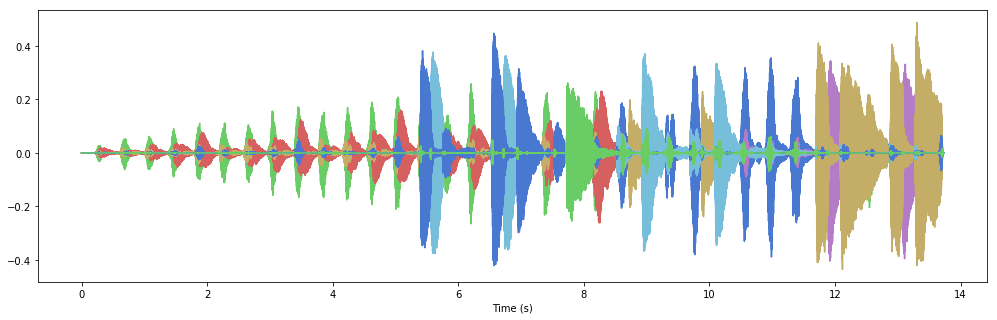

In [93]:
time = np.arange(0, float(y_k_low.shape[0]), 1) / sr 

plt.figure(figsize=(17, 5))
for ty in y_result: 
    plt.plot(time, ty)
plt.xlabel('Time (s)')
plt.legend()
plt.show()

In [38]:
# Resynthesize.  How about we isolate just first (lowest) component?
low_k = 0
k = low_k

# Reconstruct a spectrogram by the outer product of component k and its activation
D_k_low = np.multiply.outer(components[:, k], activations[k])

# invert the stft after putting the phase back in
y_k_low = librosa.istft(D_k_low * phase)

In [39]:
# And playback
print('Component #{}'.format(low_k))

IPython.display.Audio(data=y_k_low, rate=sr)

Component #0


In [40]:
# Resynthesize.  How about we isolate just first (lowest) component?
mid_k = 1
k = mid_k

# Reconstruct a spectrogram by the outer product of component k and its activation
D_k_mid = np.multiply.outer(components[:, k], activations[k])

# invert the stft after putting the phase back in
y_k_mid = librosa.istft(D_k_mid * phase)

In [41]:
# And playback
print('Component #{}'.format(mid_k))

IPython.display.Audio(data=y_k_mid, rate=sr)

Component #1


In [42]:
# Resynthesize.  How about we isolate just first (lowest) component?
high_k = 2
k = high_k

# Reconstruct a spectrogram by the outer product of component k and its activation
D_k_high = np.multiply.outer(components[:, k], activations[k])

# invert the stft after putting the phase back in
y_k_high = librosa.istft(D_k_high * phase)

In [43]:
# And playback
print('Component #{}'.format(high_k))

IPython.display.Audio(data=y_k_high, rate=sr)

Component #2


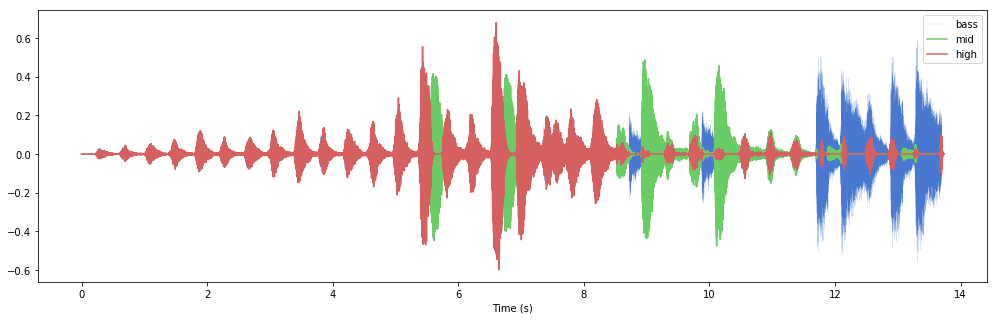

In [64]:
time = np.arange(0, float(y_k_low.shape[0]), 1) / sr 

plt.figure(figsize=(17, 5))
#plt.plot(subbassAvgs, label="subbass")
plt.plot(time, y_k_low, label="bass", linewidth=0.1)
plt.plot(time, y_k_mid, label="mid")
#plt.plot(highmidsAvgs, label="highmid")
plt.plot(time, y_k_high, label="high")
plt.xlabel('Time (s)')
plt.legend()
plt.show()

Text(0,0.5,'Amplitude')

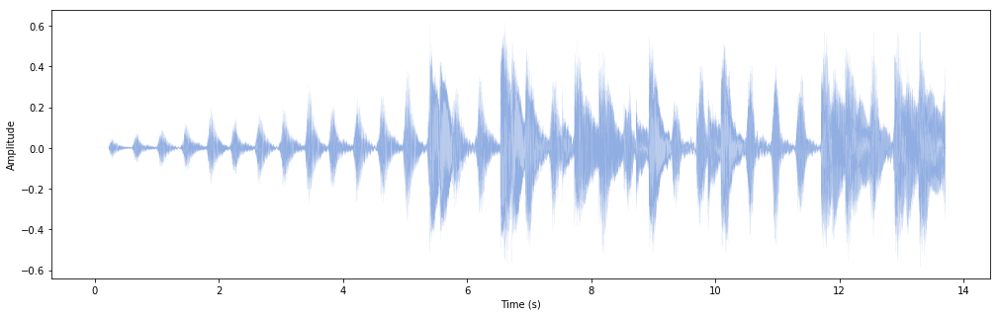

In [52]:
time = np.arange(0, float(y.shape[0]), 1) / sr 

#plot amplitude (or loudness) over time
plt.figure(figsize=(17,5))
plt.plot(time, y, linewidth=0.06, alpha=0.6)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')